In [1]:
from pandapower.plotting.plotly import pf_res_plotly
import pandapower.converter as pc
import pandapower as pp
import pandapower.plotting as pplot
import matplotlib.pyplot as plt
import pandas as pd

# Default network

Let's load the default case60nordic snapshot.
We will then make the following updates to it :
- Add object names and coordinates ;
- Modify injections to prevent overflows ;
- Create 2 variants of the snapshots with increasingly large high voltage issues.

A single-line diagram of the default network is displayed below. Please notice that it shows a version of the network where loads are attached to the grid via a transformer, while the actual 

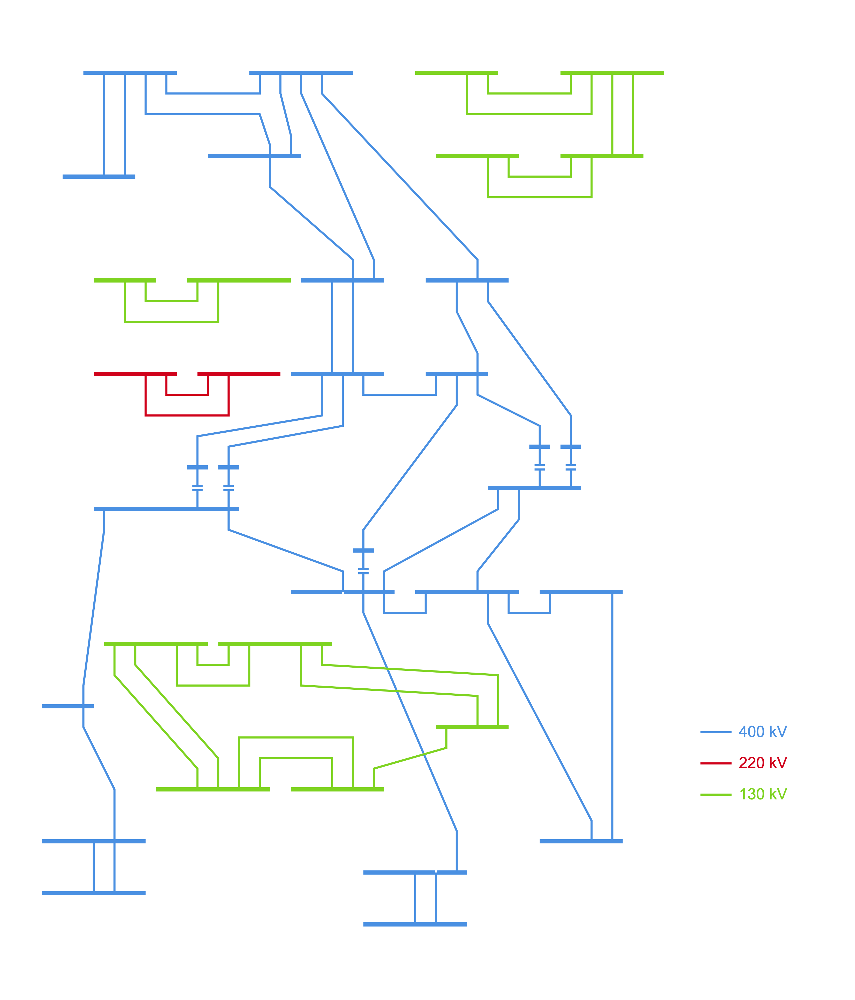

In [2]:
from IPython.display import Image
Image(filename='figures/case60nordic_white_voltage.png') 

In [3]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

net = pc.from_mpc('data/case60nordic.m')
net.gen.sn_mva = 100

# Object names

It is important to be able to quickly identify each bus and each object thanks to a unique id.

In [4]:
bus_id_to_name = {0: '1011', 1: '1012', 2: '1013', 3: '1022', 4: '1041', 5: '1042',
                  6: '1043', 7: '1044', 8: '1045', 9: '2031', 10: '2032', 11: '4071', 
                  12: '4072', 13: '4041', 14: '4042', 15: '4043', 16: '4046', 17: '4047',
                  18: '4051', 19: '4061', 20: '4062', 21: '4063', 22: '4012', 23: '1014', 
                  24: '1021', 25: '4011', 26: '4021', 27: '4022', 28: '4032', 29: '4023',
                  30: '4031', 31: '4033', 32: '4034', 33: '4035', 34: '4036', 35: '4044', 
                  36: '4045', 37: 'g1', 38: 'g2', 39: 'g3', 40: 'g4', 41: 'g5', 42: 'g6',
                  43: 'g7', 44: 'g8', 45: 'g9', 46: 'g10', 47: 'g11', 48: 'g12', 49: 'g13', 
                  50: 'g14', 51: 'g15b', 52: 'g15', 53: 'g16', 54: 'g16b', 55: 'g17', 
                  56: 'g18b', 57: 'g18', 58: 'g19', 59: 'g20'}
net.bus.name = net.bus.index.map(bus_id_to_name)

In [5]:
net.ext_grid.name = net.bus.iloc[net.ext_grid.bus].name.values
net.gen.name = net.bus.iloc[net.gen.bus].name.values
net.load.name = net.bus.iloc[net.load.bus].name.values
net.line.name = net.bus.iloc[net.line.from_bus].name.values + '_' + \
    net.bus.iloc[net.line.to_bus].name.values
net.trafo.name = net.bus.iloc[net.trafo.hv_bus].name.values + '_' + \
    net.bus.iloc[net.trafo.lv_bus].name.values

# Zones

In [6]:
net.bus.zone = 'north'
for name in ['4071', 'g19', '4072', 'g20']:
    net.bus.zone.loc[net.bus.name == name ] = 'equiv'
for name in ['4061', 'g17', '4062', '4063', 'g18', 'g18b']:
    net.bus.zone.loc[net.bus.name == name ] = 'south'
for name in ['4041', '4044', '4043', '4042', '4046', '4047', '4051', '4045',
            '1043', '1044', '1042', '1045', '1041',
            'g16', 'g16b', 'g15', 'g15b', 'g14', 'g6', 'g7', 'g13']:
    net.bus.zone.loc[net.bus.name == name ] = 'central'

# Coordinates

In [7]:
bus_geo_data_index = [ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
                      17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
                      34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
                      51, 52, 53, 54, 55, 56, 57, 58, 59]
bus_geo_data_y = [-0.87, -1.79, -0.88, -3.02, -7.22, -6.81, -6.2, -6.2, -7.22, -3.73,
                  -3.73, -0.88, -2.2, -5.08, -4.88, -5.7, -5.7, -7.84, -8.24, -6.11,
                  -7.76, -8.27, -1.79, -1.79, -3.02, -0.88, -3.02, -3.02, -3.73,
                  -3.95, -3.73, -4.54, -4.27, -4.305, -4.715, -5.7, -7.73, -2.09,
                  -0.57, -2.09, -3.32, -2.71, -6.5, -5.89, -4.04, -0.57, -2.08,
                  -2.71, -3.43, -5.45, -5.19, -7.53, -7.53, -7.94, -7.93, -7.45,
                  -8.57, -8.58, -0.57, -2.51]
bus_geo_data_x = [8.08, 8.39, 9.81, 5.73, 5.34, 8.22, 5.2, 6.32, 6.93, 5.65, 4.59,
                  4.51, 4.51, 4.83, 8.9, 8.29, 9.5, 9.51, 8.2, 4.32, 4.32, 4.33,
                  5.93, 9.81, 4.61, 6.34, 8.38, 6.84, 8.28, 8.64, 6.84,
                  6.03, 5.634, 8.59, 7.57, 6.86, 7.45, 8.3, 9.81,
                  10.03, 4.41, 5.73, 8.45, 5.4, 4.51, 6.3, 5.85, 8.48, 7.26, 5.1,
                  9.22, 9.81, 9.2, 8.19, 8.79, 4.57, 4.14, 4.76, 4.71, 4.51]
net.bus_geodata = pd.DataFrame(data = {'x': bus_geo_data_x, 'y': bus_geo_data_y},
                               index=bus_geo_data_index)

# Correcting overflows

As shown below, lines 45 and 51 and transformer 14 are higher than their respective thermal limits. This is due to the fact that the slack bus has to inject a lot of power to compensate the prod / load mismatch, thus overflowing lines and transformers that are close to it.

In [8]:
pp.runpp(net)
print('Line 51 loading : {:.0f}%'.format(net.res_line.iloc[51].loading_percent))
print('Line 45 loading : {:.0f}%'.format(net.res_line.iloc[45].loading_percent))
print('Transformer 14 loading : {:.0f}%'.format(net.res_trafo.iloc[14].loading_percent))

Line 51 loading : 118%
Line 45 loading : 116%
Transformer 14 loading : 237%


We thus propose to reduce the consumption in the north, so that it reduces the injection at the slack bus.

In [9]:
net.load.p_mw.iloc[12] = 990
net.load.q_mvar.iloc[12] = 250
pp.runpp(net)
print('Line 51 loading : {:.0f}%'.format(net.res_line.iloc[51].loading_percent))
print('Line 45 loading : {:.0f}%'.format(net.res_line.iloc[45].loading_percent))
print('Transformer 14 loading : {:.0f}%'.format(net.res_trafo.iloc[14].loading_percent))

Line 51 loading : 61%
Line 45 loading : 43%
Transformer 14 loading : 83%


Moreover, transformer 12 will cause some issues when we decrease the consumption in the south region. This is partly due to the fact that its nominal power is not suitable w.r.t. the generator it is connected to. We thus propose to increase its nominal power.

In [10]:
net.trafo.sn_mva.iloc[12] = 575
pp.runpp(net)

# Creating high voltage issues

By decreasing the consumption and generation in the south region, we will increase high voltage issues. We propose to create 3 versions of the nordic case :
- easy : no other change.
- medium : -1000 MW of consumption and production in the south region.
- hard : -2000 MW of consumption and production in the south region.
Those three snapshots are then saved.

In [11]:
central_buses = net.bus.loc[net.bus.zone=='central'].index
modes = {'easy':0, 'medium': 1000, 'hard': 2000}
for name, delta in modes.items():
    net.gen.p_mw[net.gen['bus'].isin(list(central_buses))] *= (2272-delta) / 2272
    net.load.p_mw[net.load['bus'].isin(list(central_buses))] *= (4070-delta) / 4070
    net.load.q_mvar[net.load['bus'].isin(list(central_buses))] *= (4070-delta) / 4070
    pp.runpp(net)
    pp.to_json(net, filename='data/case60nordic_{}.json'.format(name))

# Checking the snapshots

In [12]:
# EASY
net_easy = pp.from_json('data/case60nordic_easy.json')
pp.runpp(net_easy)
pf_res_plotly(net_easy);

In [13]:
# MEDIUM
net_medium = pp.from_json('data/case60nordic_medium.json')
pp.runpp(net_medium)
pf_res_plotly(net_medium);

In [14]:
# MEDIUM
net_hard = pp.from_json('data/case60nordic_hard.json')
pp.runpp(net_hard)
pf_res_plotly(net_hard);